In [1]:
import time
import platform
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import cm
from matplotlib.colors import LogNorm
from astropy.wcs import WCS
from astropy.io import fits
from matplotlib import colors
from astropy import units as u

In [2]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [3]:
cd '/home/vdomcek/Dropbox/work/2016_casa/zenodo/'

/home/vdomcek/Dropbox/work/2016_casa/zenodo


# Contents
### This jupyter lab notebook recreates all the paper figures - Fig.1 -> Fig.A6 (with exception of Fig.9 which is made in zenodo_casa_SED.ipynb)
### Additionally this script also constructs region filtering masks that are used here and in zenodo_casa_SED.ipynb

# Masks

### Hi-res data masks

In [4]:
hdu_radio_hires_lowflux_mask = fits.open('data/intermediate_products/5_mask_bin3_radio_hires_lowflux.fits')
radio_hires_lowflux_mask = hdu_radio_hires_lowflux_mask[0].data

hdu_spitzer_stars_mask = fits.open('data/intermediate_products/5_mask_bin3_spitzer_stars_daosf.fits')
spitzer_stars_mask = hdu_spitzer_stars_mask[0].data

hdu_spitzer_stars_mask_smooth = fits.open('data/intermediate_products/5_mask_bin3_spitzer_stars_smooth.fits')
spitzer_stars_mask_smooth = hdu_spitzer_stars_mask_smooth[0].data

hdu_extinction_mask = fits.open('data/intermediate_products/5_mask_bin3_nH.fits')
extinction_mask = hdu_extinction_mask[0].data

hdu_frac_mask = fits.open('data/intermediate_products/5_mask_bin3_radio_thermal_fraction.fits')
frac_mask = hdu_frac_mask[0].data

hdu_SPINBL10 = fits.open('data/intermediate_products/5_mask_bin3_alpha_R.fits')
BL10mask = hdu_SPINBL10[0].data


the_mask = radio_hires_lowflux_mask * spitzer_stars_mask * extinction_mask * frac_mask
the_lowres_mask = radio_hires_lowflux_mask * spitzer_stars_mask_smooth * extinction_mask * frac_mask * BL10mask

# Fig.1 radio + infrared

In [5]:
### Load data

In [6]:
hdu_spitzer_bin3_ch1 = fits.open('data/intermediate_products/3_Spitzer_bin3_ch1_xheader_jy.fits')[0]
img_spitzer_bin3_ch1 = hdu_spitzer_bin3_ch1.data

hdu_radio_4_72Ghz_bin3 = fits.open('data/intermediate_products/3_Hires_bin3_xheader_fluxed_2009_nomask.fits')[0]
img_radio_4_72Ghz_bin3 = hdu_radio_4_72Ghz_bin3.data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("magma"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in less
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrBr"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' par

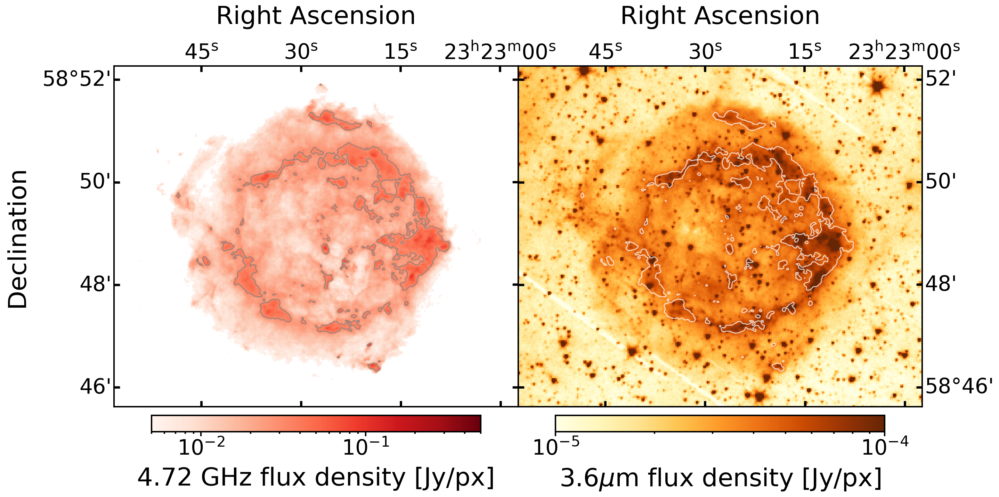

In [7]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'font.size': 20,
          'figure.dpi': 150
         }
plt.rcParams.update(params)


fig = plt.figure(figsize=(20,11),dpi=150)



ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1.header))

cmap = cm.get_cmap('magma')
cmap.set_bad(color='white')
radio_im = np.copy(img_radio_4_72Ghz_bin3)
radio_im[radio_im<5e-3] = np.nan
im = ax.imshow(radio_im, cmap='Reds', norm=LogNorm(vmin=5e-3, vmax=5e-1))#, vmin=-0.8, vmax=-0.5)
ax.set_xlim(80, 400)
ax.set_ylim(120, 390)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'4.72 GHz flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_radio_4_72Ghz_bin3.header))


cmap = cm.get_cmap('YlOrBr')
cmap.set_bad(color='white')
im2 = ax2.imshow(img_spitzer_bin3_ch1, cmap=cmap, norm=LogNorm(vmin=10e-6, vmax=1e-4))
ax2.set_xlim(80, 400)
ax2.set_ylim(120, 390)
# ax[0].coords.grid(color='white')
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')

# ax2.coords['dec'].set_axislabel('Declination')
# ax2.coords['dec'].set_axislabel_position('right')
ax2.coords['dec'].set_ticklabel_position('right')
# ax2.coords['dec'].set_ticklabel_width(3)

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)

cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'3.6$\mu$m flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)

plt.savefig('figures/fig1_radio_spitzer_cont.pdf',bbox_inches='tight')
plt.show()


# Fig.2 - procedure

This was created outside of python enviroment

# Fig.3 - extinction

In [8]:
hdu_nH = fits.open('data/intermediate_products/3_grid_nh_repro.fits')

In [9]:
img_array_NH = hdu_nH[0].data
img_array_Av = img_array_NH / 0.221  # NH to Av
img_array_A_ch1 = img_array_Av * 0.063  # A_ch1/A_v = 0.56/8.8
img_array_A_ch1[img_array_A_ch1 < 0.1] = np.nan

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.


In [10]:
0.1/0.063*0.221

0.3507936507936508

In [11]:
def nh_av(nh):
    av = nh / (np.random.normal(2.21, 0.09, nh.size) * 1e21)
    return av

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("magma"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases

<Figure size 900x600 with 0 Axes>

/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)


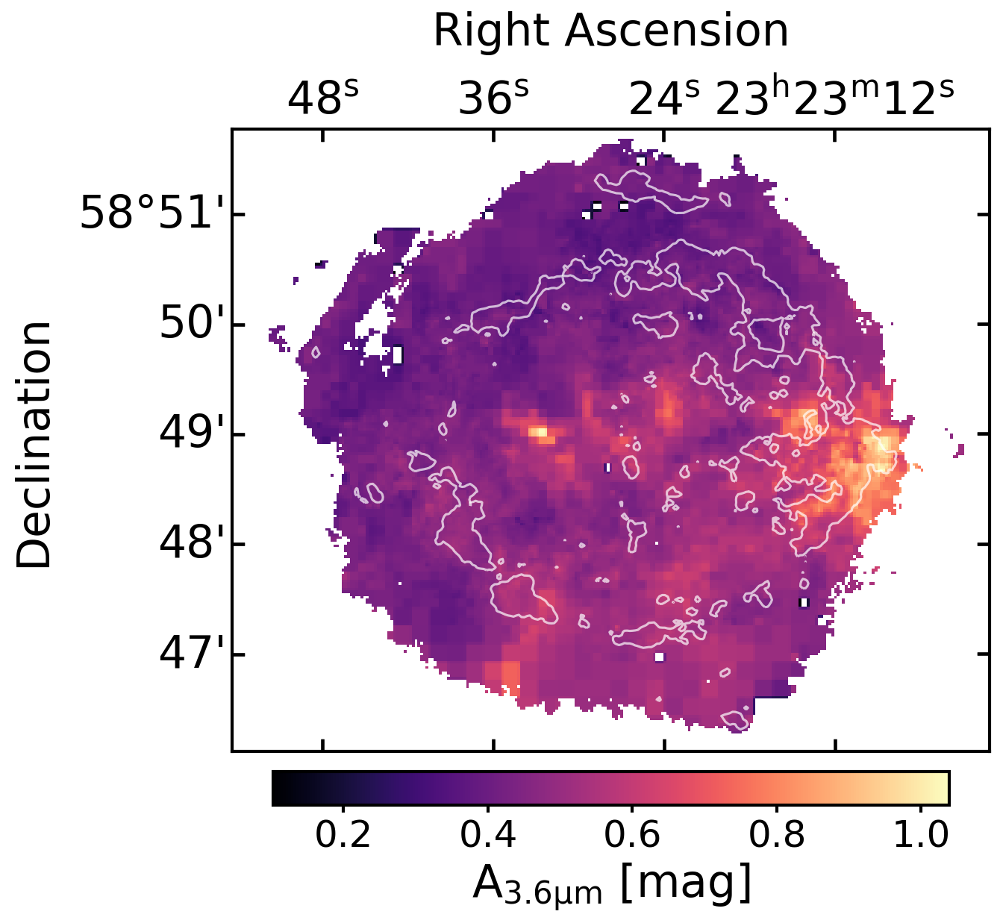

In [12]:
from matplotlib import cm
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'figure.dpi': 150,
          'axes.linewidth': 2
         }

plt.clf()
fig = plt.figure(figsize=(14,8),dpi=150)
plt.rcParams.update(params)
#cmap = cm.get_cmap('magma_r')#, 12) #12 steps on the sidebar

plt.subplots_adjust(wspace=0.01)
plt.subplots_adjust(hspace=0.35)

ax1 = plt.subplot(111, projection=WCS(hdu_nH[0].header))
# ax1.set_title('Spitzer Ch1')
cmap = cm.get_cmap('magma')
cmap.set_bad(color='white')

im = ax1.imshow(img_array_A_ch1*radio_hires_lowflux_mask, origin='lower', cmap=cmap)
cbar = fig.colorbar(im, ax=ax1, fraction=0.05, pad=0.03, orientation="horizontal") 
cbar.set_label(r'A$_\mathrm{3.6\mu m}$ [mag]',fontsize='x-large')
cbar.ax.tick_params(labelsize='large')
cbar.ax.tick_params(labelsize='large', which='major', length=5, width=2)
cbar.ax.tick_params(labelsize='large', which='minor', length=3, width=2)


ax1.set_xlim(100, 380)
ax1.set_ylim(140, 370)
ax1.coords['ra'].set_axislabel('Right Ascension')
ax1.coords['ra'].set_axislabel_position('top')
ax1.coords['ra'].set_ticklabel_position('top')
ax1.coords['dec'].set_axislabel('Declination')
# ax1.set_xlim(80, 400)
# ax1.set_ylim(120, 390)

ax1.tick_params(axis='x', which='major', width=2.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax1.tick_params(axis='y', which='major', width=2.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax1.tick_params(axis='both', which='minor', length=4)

ax1.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)


plt.savefig('figures/fig2_ext_map_ch1.pdf',bbox_inches='tight')

plt.show()


# Fig.4 - Calibrated Spitzer data

In [13]:
hdu_spitzer_bin3_ch1_cor = fits.open('data/final_products/alpha_RIR_high-res/spitzer_flux_median_masked.fits')[0]
img_spitzer_bin3_ch1_cor = hdu_spitzer_bin3_ch1_cor.data


/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrBr"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:1207: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization

<Figure size 900x600 with 0 Axes>

/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:1207: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/pytho

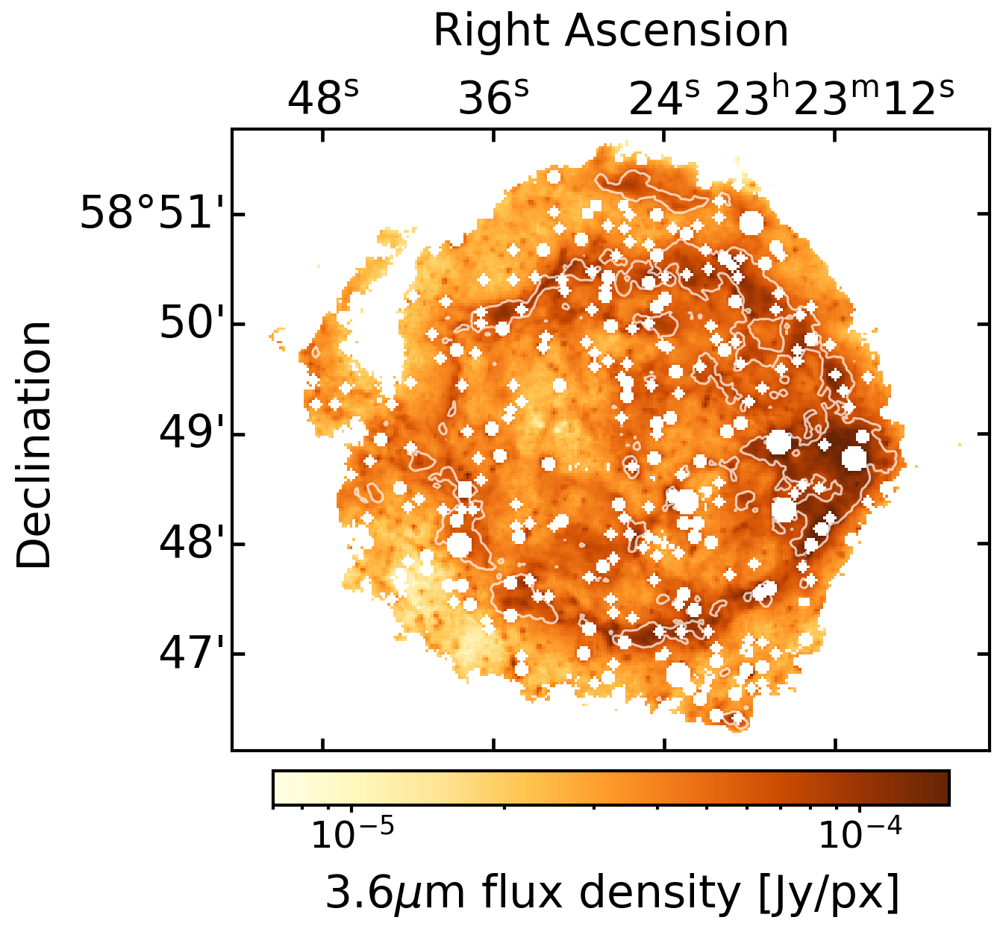

In [14]:
#Same thing in the DETECTOR COORDINATES
from matplotlib import cm
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'figure.dpi': 150,
          'axes.linewidth': 2
         }

plt.clf()
fig = plt.figure(figsize=(14,8),dpi=150)
plt.rcParams.update(params)
#cmap = cm.get_cmap('magma_r')#, 12) #12 steps on the sidebar

plt.subplots_adjust(wspace=0.01)
plt.subplots_adjust(hspace=0.35)

ax1 = plt.subplot(111, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))
# ax1.set_title('Spitzer Ch1')
cmap = cm.get_cmap('YlOrBr')
cmap.set_bad(color='white')

im = ax1.imshow(img_spitzer_bin3_ch1_cor*the_mask, cmap=cmap, norm=LogNorm(vmin=7e-6, vmax=1.5e-4))
cbar = fig.colorbar(im, ax=ax1, fraction=0.05, pad=0.03, orientation="horizontal") 
cbar.set_label(r'3.6$\mu$m flux density [Jy/px]', rotation=0, labelpad=10,fontsize='x-large')
cbar.ax.tick_params(labelsize='large')
cbar.ax.tick_params(labelsize='large', which='major', length=5, width=2)
cbar.ax.tick_params(labelsize='large', which='minor', length=3, width=2)


ax1.set_xlim(100, 380)
ax1.set_ylim(140, 370)
ax1.coords['ra'].set_axislabel('Right Ascension')
ax1.coords['ra'].set_axislabel_position('top')
ax1.coords['ra'].set_ticklabel_position('top')
ax1.coords['dec'].set_axislabel('Declination')


ax1.tick_params(axis='x', which='major', width=2.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax1.tick_params(axis='y', which='major', width=2.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax1.tick_params(axis='both', which='minor', length=4)
ax1.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)

plt.savefig('figures/fig3_Spitzer_ch1_corrected_cont.pdf',bbox_inches='tight')


plt.show()


# Fig.5 - hi-res spectral index + uncertainties

In [15]:
alpha = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_median_masked.fits')[0].data
alpha_err = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_err_masked.fits')[0].data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Oranges"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() i

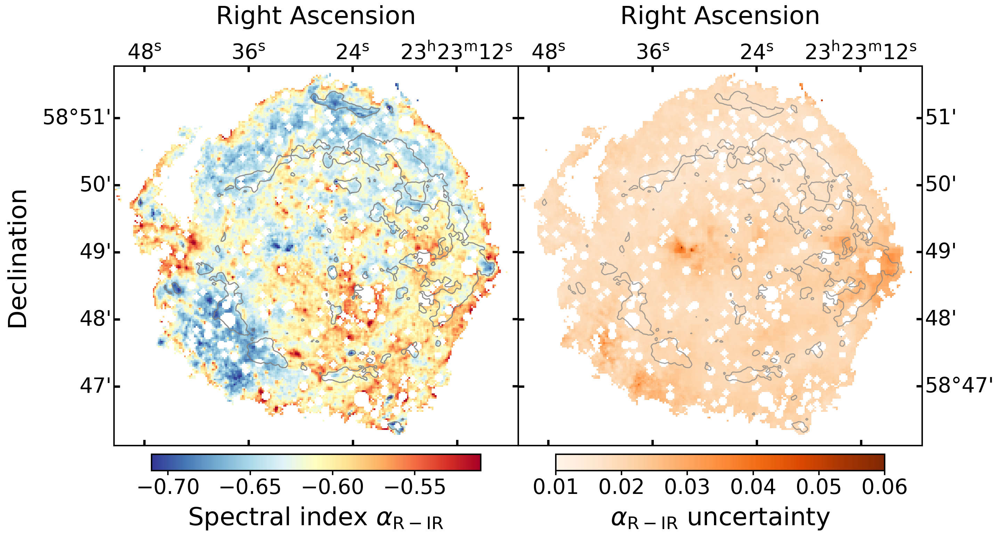

In [16]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha*the_mask, cmap=cmap, vmin=-0.71, vmax=-0.51)
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))


cmap = cm.get_cmap('Oranges')
cmap.set_bad(color='white')

im2 = ax2.imshow(alpha_err*the_mask, cmap=cmap, vmin=0.01, vmax=0.06)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')


ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
# cbar.set_clim(0, 1)

cbar.set_label(r'$\alpha _\mathrm{R-IR}$ uncertainty', rotation=0, labelpad=10)

cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)


ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)
ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)

plt.savefig('figures/fig5_sp_index_and_err_RdYlBu.pdf',bbox_inches='tight')
plt.show()


# Fig.6 - Radio spectral index

In [17]:
hdu_SPINBL10 = fits.open('data/final_products/alpha_radio/3_SPIXBL10CORR_bin3_xheader.fits')
img_SPINBL10 = hdu_SPINBL10[0].data

hdu_SPINERR10 = fits.open('data/final_products/alpha_radio/3_SPIXERR10_bin3_xheader.fits')
img_SPINERR10 = hdu_SPINERR10[0].data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/li

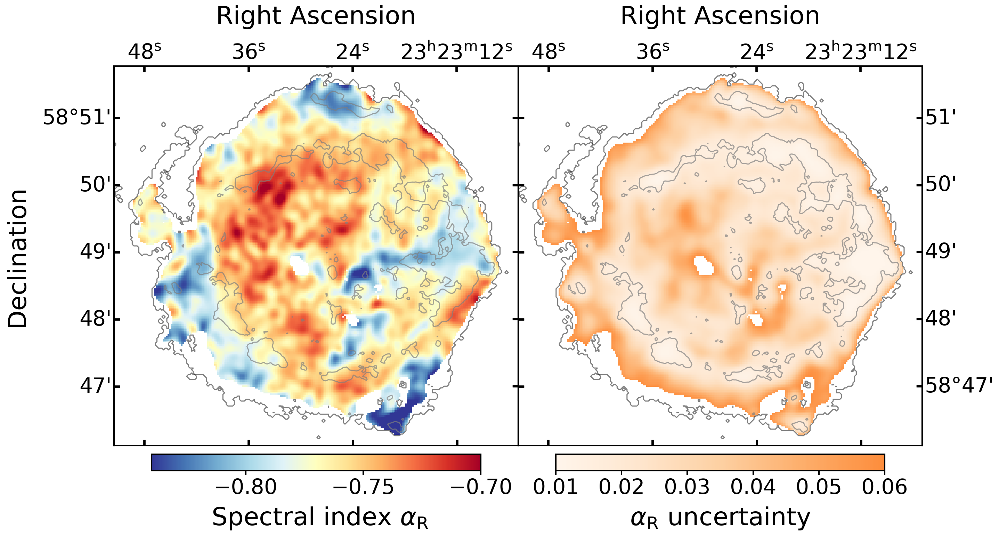

In [18]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_SPINBL10[0].header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(img_SPINBL10*frac_mask, cmap=cmap, vmin=-0.7, vmax=-0.84)
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r' Spectral index $\alpha _\mathrm{R}$', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_SPINERR10[0].header))


cmap = cm.get_cmap('Oranges')
cmap = truncate_colormap(cmap, 0., 0.5)
cmap.set_bad(color='white')
im2 = ax2.imshow(img_SPINERR10*BL10mask*frac_mask, cmap=cmap, vmin=0.01, vmax=0.06)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')


ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
# cbar.set_clim(0, 1)

cbar.set_label(r'$\alpha _\mathrm{R}$ uncertainty', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

test_map = np.copy(frac_mask)
test_map[np.isnan(test_map)] = 0
test_map[200:300,200:300] = 1
ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax2.contour(test_map, levels=[1], colors='black', alpha=0.5)

plt.savefig('figures/fig6_radio_sp_index_cont_RdYlBu.pdf',bbox_inches='tight')
plt.show()


# Fig.7 - masked regions

## Creating masks

#### Steep radio mask

In [21]:
regions0 = np.ones_like(the_mask)

for y in range(len(alpha)):
    for x in range(len(alpha[0])):
        if x+y < 230: regions0[y,x] = np.nan
        if x+y > 480: regions0[y,x] = np.nan
        if x-y > 200: regions0[y,x] = np.nan
        if x-y < 110: regions0[y,x] = np.nan

steep_mask = regions0 * radio_hires_lowflux_mask 
steep_mask_invert = np.copy(steep_mask)

steep_mask_invert[steep_mask_invert == 1] = 0
steep_mask_invert[np.isnan(steep_mask_invert)] = 1
steep_mask_invert[steep_mask_invert == 0] = np.nan

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/li

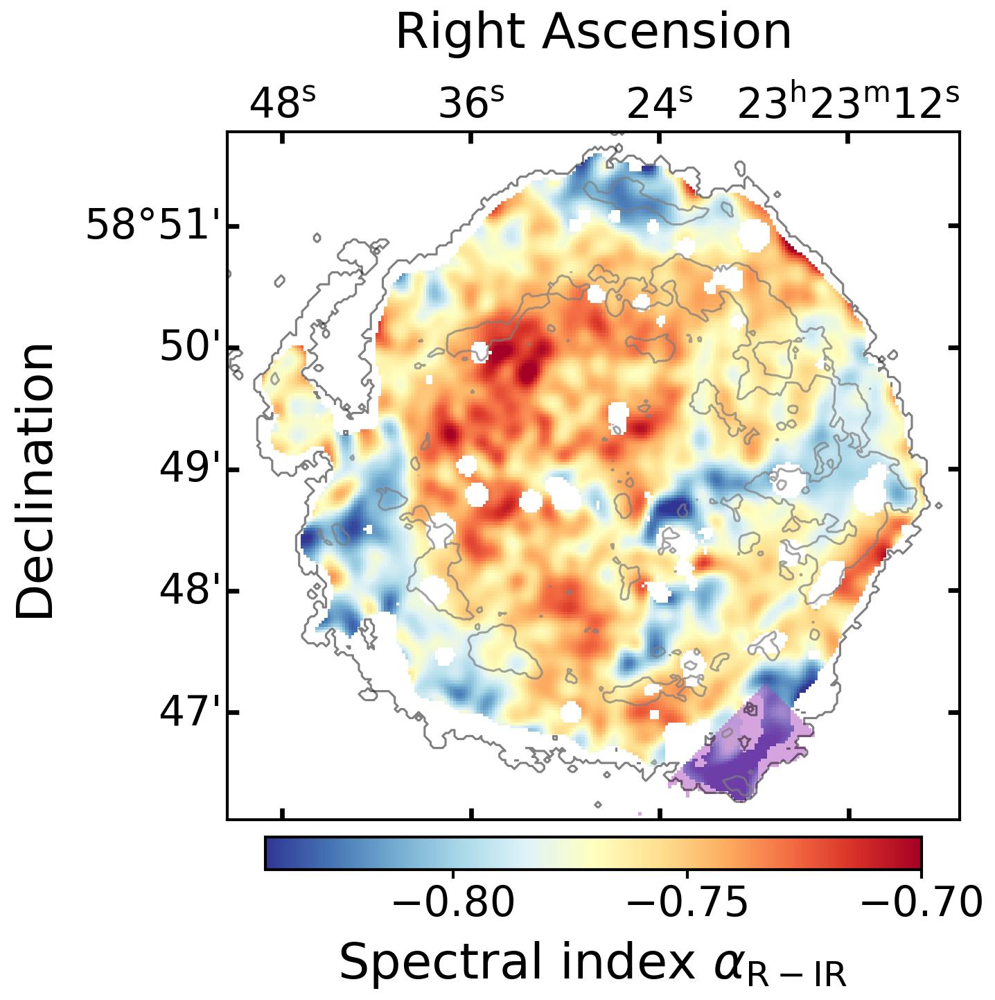

In [22]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(img_SPINBL10*the_lowres_mask, cmap=cmap, vmin=-0.7, vmax=-0.84)

cmap2 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(steep_mask, origin='lower',cmap=cmap2, vmin=0, vmax=2.5, alpha=0.5, label='Steep radio')

ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)

test_map = np.copy(frac_mask)
test_map[np.isnan(test_map)] = 0
test_map[200:300,200:300] = 1
ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

plt.show()

#### Southeast mask

In [23]:
regions1 = np.ones_like(the_mask)

for y in range(len(regions1)):
    for x in range(len(regions1[0])):
        if x+y < 360: regions1[y,x] = np.nan
        if x+y > 410: regions1[y,x] = np.nan
        if x-y > 20: regions1[y,x] = np.nan
        if x-y < -60: regions1[y,x] = np.nan
            
south_east_mask = regions1*the_mask

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor relea

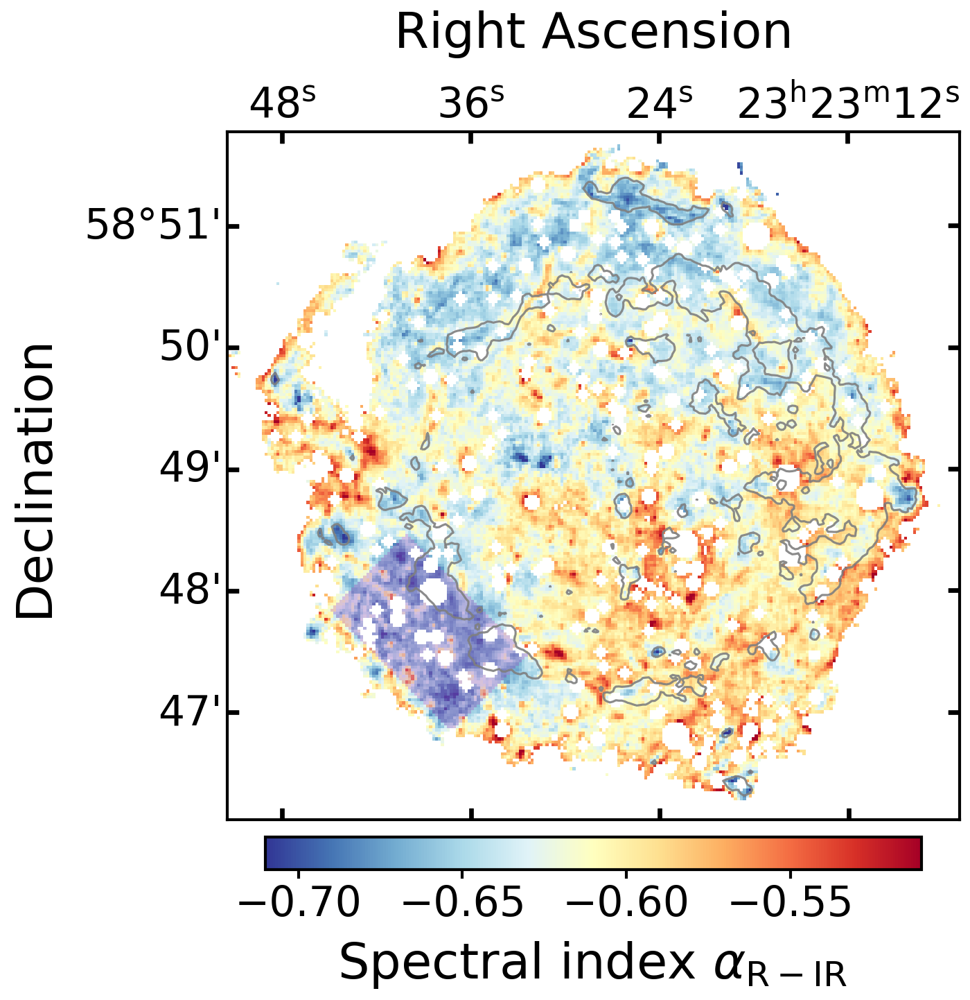

In [24]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha*the_mask, cmap=cmap, vmin=-0.71, vmax=-0.51)

cmap2 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(south_east_mask, origin='lower',cmap=cmap2, vmin=0, vmax=2.5, alpha=0.3, label='Southeast')

ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)

ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)
plt.show()

In [25]:
hdu = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_median_masked.fits')
img = hdu[0].data

header = hdu[0].header
header['history'] = '--------------------------------------------------'
header['history'] = 'Used script:    zenodo_casa_figures.ipynb'
header['history'] = 'Author:         Vladimir Domcek'
header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
header['history'] = 'Main changes: '
header['history'] = 'Southeast mask of steeper region '  

hdu[0].data = south_east_mask
hdu.writeto('data/intermediate_products/6_analysis_mask_southeast.fits', overwrite=True)
hdu.close()

#### Outer rim region

In [26]:
regions2 = np.ones_like(the_mask)

cx_fin, cy_fin = 240, 257
r_f = 95
r_fout=120

for y in range(len(regions2)):
    for x in range(len(regions2[0])):
        # check if point lies within radius r
        if (x-cx_fin)**2 + (y-cy_fin)**2 < r_f**2:
            regions2[y,x] = np.nan
        if (x-cx_fin)**2 + (y-cy_fin)**2 > r_fout**2:
            regions2[y,x] = np.nan
            
outer_rim_mask = regions2 * the_mask * steep_mask_invert

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor relea

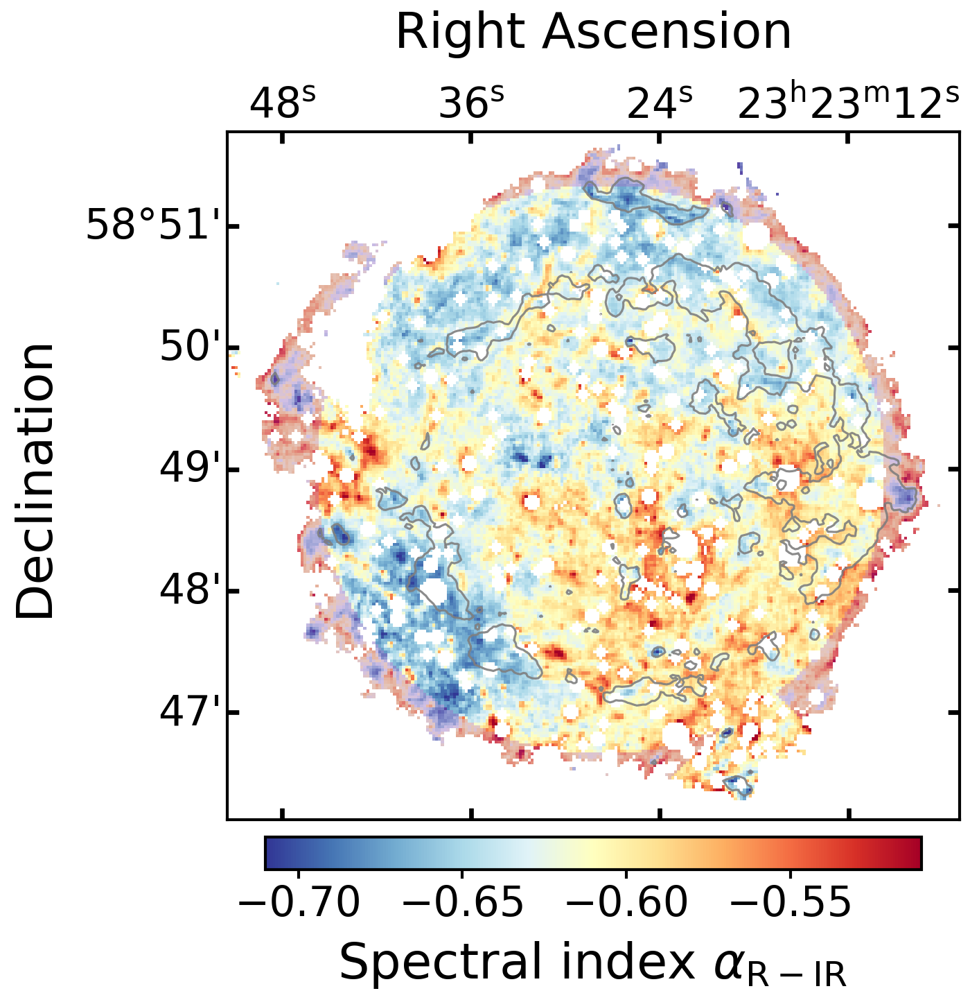

In [27]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha*the_mask, cmap=cmap, vmin=-0.71, vmax=-0.51)

cmap2 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(outer_rim_mask, origin='lower',cmap=cmap2, vmin=0, vmax=2.5, alpha=0.3, label='Outer rim')

ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)

ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)
plt.show()

In [28]:
hdu = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_median_masked.fits')
img = hdu[0].data

header = hdu[0].header
header['history'] = '--------------------------------------------------'
header['history'] = 'Used script:    zenodo_casa_figures.ipynb'
header['history'] = 'Author:         Vladimir Domcek'
header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
header['history'] = 'Main changes: '
header['history'] = 'Outer rim mask of flatter region'  

hdu[0].data = outer_rim_mask
hdu.writeto('data/intermediate_products/6_analysis_mask_outer_rim.fits', overwrite=True)
hdu.close()

### Northern arc

In [29]:
regions3 = np.ones_like(the_mask)

cx_in, cy_in = 250, 270
r_in=65
cx_out, cy_out = 250, 270
r_out=80

for y in range(len(regions3)):
    for x in range(len(regions3[0])):
        # check if point lies within radius r
        if (x-cx_in)**2 + (y-cy_in)**2 < r_in**2:
            regions3[y,x] = np.nan
        if (x-cx_out)**2 + (y-cy_out)**2 > r_out**2:
            regions3[y,x] = np.nan
        if y<270: regions3[y,x] = np.nan
    
arc_mask = regions3 * the_mask

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor relea

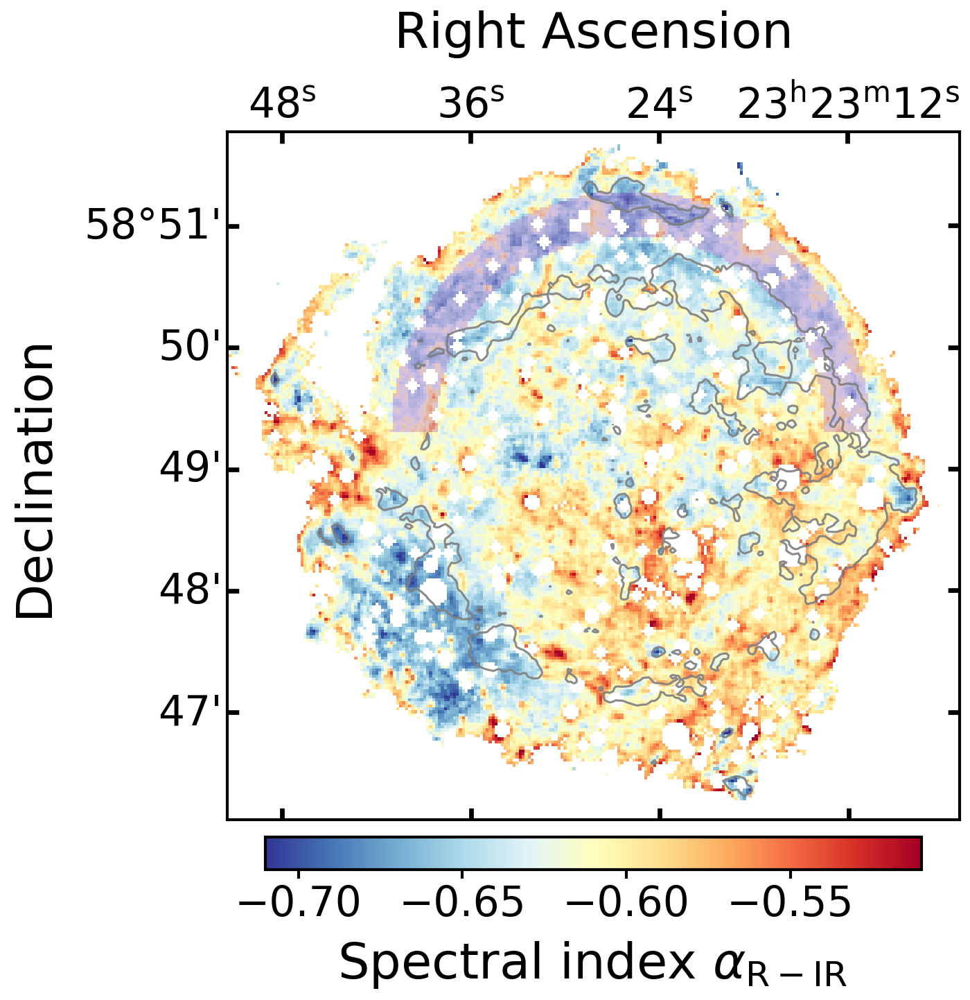

In [30]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha*the_mask, cmap=cmap, vmin=-0.71, vmax=-0.51)

cmap2 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(arc_mask, origin='lower',cmap=cmap2, vmin=0, vmax=2.5, alpha=0.3, label='Northern arc')

ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)

ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)
plt.show()

In [31]:
hdu = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_median_masked.fits')
img = hdu[0].data

header = hdu[0].header
header['history'] = '--------------------------------------------------'
header['history'] = 'Used script:    zenodo_casa_figures.ipynb'
header['history'] = 'Author:         Vladimir Domcek'
header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
header['history'] = 'Main changes: '
header['history'] = 'Northern arc mask of relative steepening '  

hdu[0].data = arc_mask
hdu.writeto('data/intermediate_products/6_analysis_mask_arc.fits', overwrite=True)
hdu.close()

#### Southwest quadrant mask

In [32]:
regions4 = np.ones_like(the_mask)

for y in range(len(regions4)):
    for x in range(len(regions4[0])):
        if x < 245: regions4[y,x] = np.nan
        if y > 265: regions4[y,x] = np.nan
            
southwest_mask = regions4 * the_mask * steep_mask_invert

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor relea

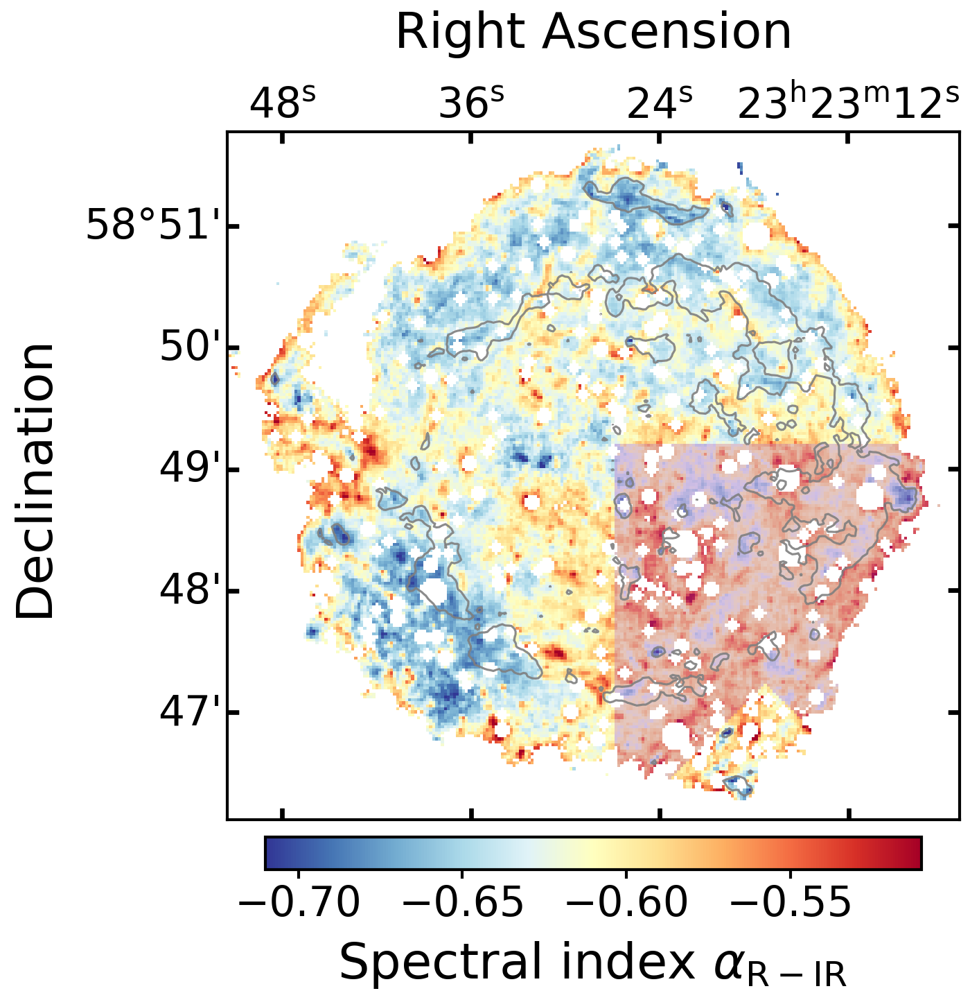

In [33]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1_cor.header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha*the_mask, cmap=cmap, vmin=-0.71, vmax=-0.51)

cmap2 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(southwest_mask, origin='lower',cmap=cmap2, vmin=0, vmax=2.5, alpha=0.3, label='Northern arc')

ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)

ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)
plt.show()

In [34]:
hdu = fits.open('data/final_products/alpha_RIR_high-res/alpha_R-IR_median_masked.fits')
img = hdu[0].data

header = hdu[0].header
header['history'] = '--------------------------------------------------'
header['history'] = 'Used script:    zenodo_casa_figures.ipynb'
header['history'] = 'Author:         Vladimir Domcek'
header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
header['history'] = 'Main changes: '
header['history'] = 'Southwest quadrant mask of greater flattening'  

hdu[0].data = southwest_mask
hdu.writeto('data/intermediate_products/6_analysis_mask_southwest.fits', overwrite=True)
hdu.close()

### Fig.8 - all regions together

/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, infra

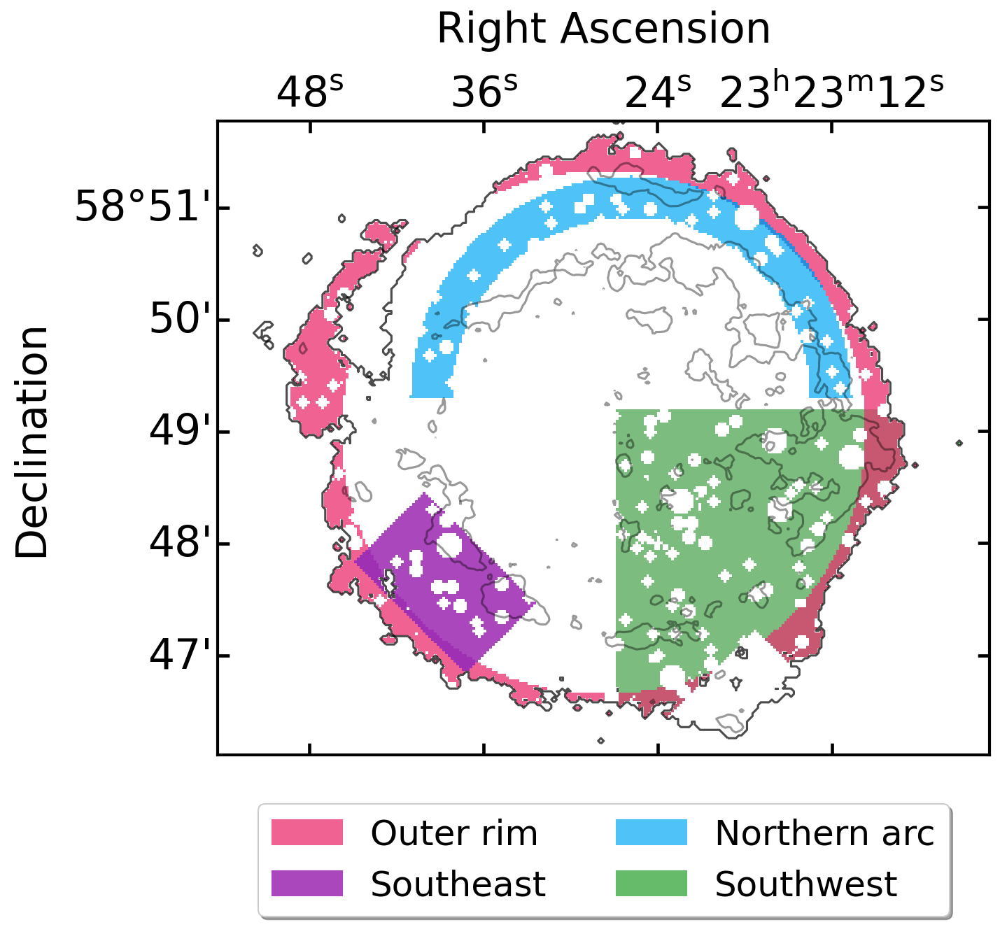

In [35]:
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'figure.dpi': 150,
          'axes.linewidth': 2
         }
plt.rcParams.update(params)

masked_region1=regions1*the_mask
masked_region2=regions2*the_mask
masked_region3=regions3*the_mask
masked_region4=regions4*the_mask
fig = plt.figure(figsize=(11,8))
ax = plt.subplot(projection=WCS(hdu_spitzer_bin3_ch1.header))
ax.tick_params(axis='x', which='major', width=2.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=2.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('t')
ax.coords['ra'].set_ticklabel_position('t')

ax.coords['dec'].set_axislabel('Declination')
ax.coords['dec'].set_axislabel_position('l')
ax.coords['dec'].set_ticklabel_position('l')

cmap1 = colors.ListedColormap(['#E0E0E0'])

current_cmap = cm.get_cmap('magma')

cmap2 = colors.ListedColormap(['#F06292'])
im3 = ax.imshow(outer_rim_mask, origin='lower', cmap=cmap2, label='Outer rim')
# cbar = fig.colorbar(im3, fraction=0.038, pad=0.02, orientation="horizontal") 

cmap3 = colors.ListedColormap(['#4FC3F7'])
im4 = ax.imshow(arc_mask, origin='lower',cmap=cmap3, label='Northern arc')
# # cbar = fig.colorbar(im4, fraction=0.038, pad=0.02, orientation="horizontal") 

cmap8 = colors.ListedColormap(['#1976D2'])
im6 = ax.imshow(outer_rim_mask*arc_mask, origin='lower',cmap=cmap8, alpha=0.7)


cmap4 = colors.ListedColormap(['#AB47BC'])
im2 = ax.imshow(1*south_east_mask, origin='lower',cmap=cmap4, label='Southeast')

cmap7 = colors.ListedColormap(['#9C27B0'])
im6 = ax.imshow(outer_rim_mask*south_east_mask, origin='lower',cmap=cmap7,alpha=0.7)

cmap5 = colors.ListedColormap(['#43A047'])
im5 = ax.imshow(1*southwest_mask, origin='lower',cmap=cmap5, label='Southwest',alpha=0.7)

cmap6 = colors.ListedColormap(['#EC407A'])
im5 = ax.imshow(outer_rim_mask*southwest_mask, origin='lower',cmap=cmap6, alpha=0.7)

# cmap1x = colors.ListedColormap(['#ffffff'])
# im1x = plt.imshow(region_steep*the_mask, cmap=cmap1x, origin='lower')

ax.set_xlim(100, 380)
ax.set_ylim(140, 370)


whole_patch = mpatches.Patch(color='#FFCA28', label='Whole remnant')
outer_patch = mpatches.Patch(color='#F06292', label='Outer rim')
arc_patch = mpatches.Patch(color='#4FC3F7', label='Northern arc')
southeast_patch = mpatches.Patch(color='#AB47BC', label='Southeast')
southwest_patch = mpatches.Patch(color='#66BB6A', label='Southwest')

plt.legend(handles=[ outer_patch, southeast_patch, arc_patch, southwest_patch ], ncol=2, loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True)


ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='black', alpha=0.4)
ax.contour(test_map, levels=[1], colors='black', alpha=0.7)
# plt.legend()
plt.savefig('figures/fig8_hist_masking_cont.pdf',bbox_inches='tight')

plt.show()
plt.close()

# Fig.8 - Histogram and SED 
### --> moved to zenodo_casa_SED.ipynb together with Table 1 calculations

# Fig.9 - Alpha diff

In [19]:
diff = fits.open('data/final_products/alpha_diff/diff_alpha_median_masked.fits')[0].data
diff_err = fits.open('data/final_products/alpha_diff/diff_alpha_err_masked.fits')[0].data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("magma"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/p

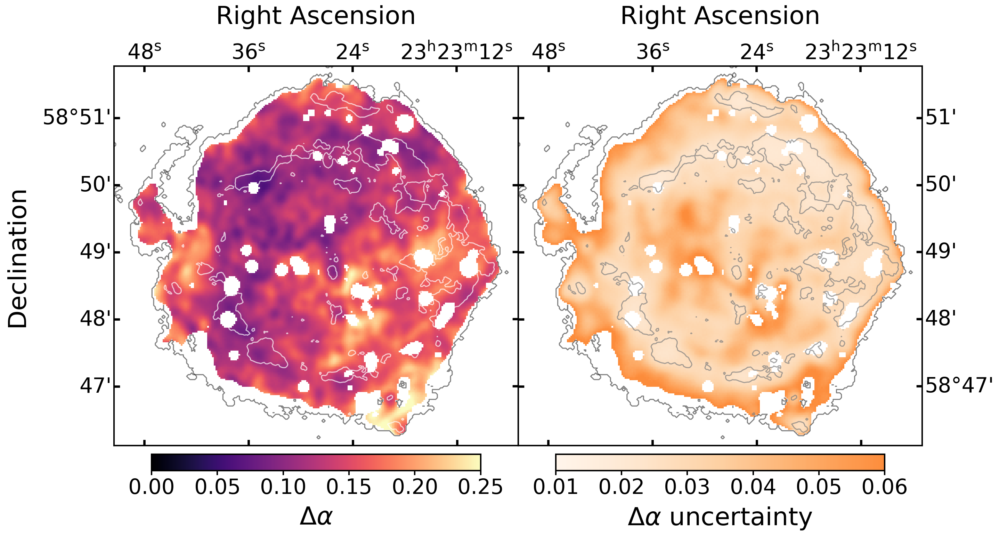

In [20]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)
diff_mask = radio_hires_lowflux_mask * extinction_mask * spitzer_stars_mask_smooth * frac_mask

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_SPINBL10[0].header))

cmap = cm.get_cmap('magma')
cmap.set_bad(color='white')
# cmap = truncate_colormap(cmap, 0., 0.95)



im = ax.imshow(diff*diff_mask, cmap=cmap, vmin=0.0, vmax=0.25)
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'$\Delta \alpha $', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_SPINERR10[0].header))


cmap = cm.get_cmap('Oranges')
cmap = truncate_colormap(cmap, 0., 0.5)
cmap.set_bad(color='white')
im2 = ax2.imshow(diff_err*diff_mask, cmap=cmap, vmin=0.01, vmax=0.06)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')


ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
# cbar.set_clim(0, 1)

cbar.set_label(r'$\Delta \alpha $ uncertainty', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

test_map = np.copy(frac_mask)
test_map[np.isnan(test_map)] = 0
test_map[200:300,200:300] = 1
ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax2.contour(test_map, levels=[1], colors='black', alpha=0.5)

plt.savefig('figures/fig7_sp_diff_img_cont_RdYlBu.pdf',bbox_inches='tight')
plt.show()


# Fig.10 - Sketch from adobe

# Fig.11 - break frequency and magnetic field -- alpha_1 = -0.55

In [36]:
hdu_Hires = fits.open('data/final_products/alpha_RIR_high-res/radio_flux_median_masked.fits')
img_Hires = hdu_Hires[0].data

hdu_Spitzer = fits.open('data/final_products/alpha_RIR_high-res/spitzer_flux_median_masked.fits')
img_Spitzer = hdu_Spitzer[0].data

In [37]:
nu_VLA = 4.72e9
nu_spitzer = (3.6 * u.micron).to(u.Hz, equivalencies=u.spectral()).value
alpha_1 = -0.55
ds_alpha = 0.5

nu_br = (img_Spitzer/img_Hires*the_mask)**(1/ds_alpha) * (nu_spitzer/nu_VLA)**(-(1/ds_alpha)*(alpha_1)) * nu_spitzer

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


In [38]:
t_age = 100
B = 0.96*(nu_br/nu_spitzer)**(-1/3) * (t_age/100)**(-2/3)

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("OrRd_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/

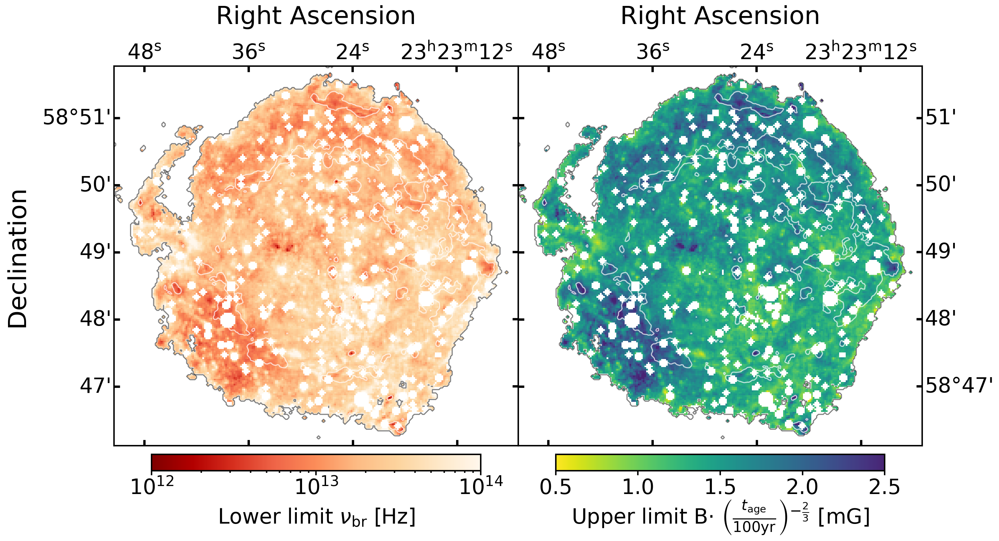

In [39]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'font.size': 20,
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_spitzer_bin3_ch1.header))

cmap = cm.get_cmap('OrRd_r')
cmap.set_bad(color='white')
# cmap = truncate_colormap(cmap, 0., 0.95)

im = ax.imshow(nu_br, cmap=cmap, norm=LogNorm(vmin=1e12, vmax=1e14))
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True, bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True, left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'Lower limit $\nu _\mathrm{br}$ [Hz]', rotation=0, labelpad=12,fontsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)


ax2 = fig.add_subplot(122, projection=WCS(hdu_spitzer_bin3_ch1.header))

cmap = cm.get_cmap('viridis_r')
cmap = truncate_colormap(cmap, 0., 0.9)
cmap.set_bad(color='white')

im2 = ax2.imshow(B, cmap=cmap, vmin=0.5, vmax=2.5)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')
ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True, bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True, left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'Upper limit B$\cdot$ $\left( \frac{t_\mathrm{age}}{100\mathrm{yr}} \right)^{-\frac{2}{3}}}$ [mG]', rotation=0, labelpad=0,fontsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

test_map = np.copy(frac_mask)
test_map[np.isnan(test_map)] = 0
test_map[200:300,200:300] = 1
ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax2.contour(test_map, levels=[1], colors='black', alpha=0.5)

plt.savefig('figures/fig11_freq_break_mag_field.pdf',bbox_inches='tight')
plt.show()



# Fig.12 - break frequency and magnetic field -- Delta alpha = 0.22

In [40]:
hdu_smo_Hires = fits.open('data/final_products/alpha_RIR_low-res/radio_flux_median_lowres_masked.fits')
img_smo_Hires = hdu_smo_Hires[0].data

hdu_smo_Spitzer = fits.open('data/final_products/alpha_RIR_low-res/spitzer_flux_median_lowres_masked.fits')
img_smo_Spitzer = hdu_smo_Spitzer[0].data

alpha_R = fits.open('data/final_products/alpha_radio/3_SPIXBL10CORR_bin3_xheader.fits')[0].data

In [41]:
nu_VLA = 4.72e9
nu_spitzer = (3.6 * u.micron).to(u.Hz, equivalencies=u.spectral()).value
alpha_delta = 0.22
smo_mask = radio_hires_lowflux_mask * extinction_mask * spitzer_stars_mask_smooth 
ds_alpha = 0.5
nu_br = (img_smo_Spitzer/img_smo_Hires*smo_mask)**(1/ds_alpha) * (nu_spitzer/nu_VLA)**(-(1/ds_alpha)*(alpha_R+alpha_delta)) * nu_spitzer

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


In [42]:
t_age = 100
B = 0.96*(nu_br/nu_spitzer)**(-1/3) * (t_age/100)**(-2/3)

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("OrRd_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/

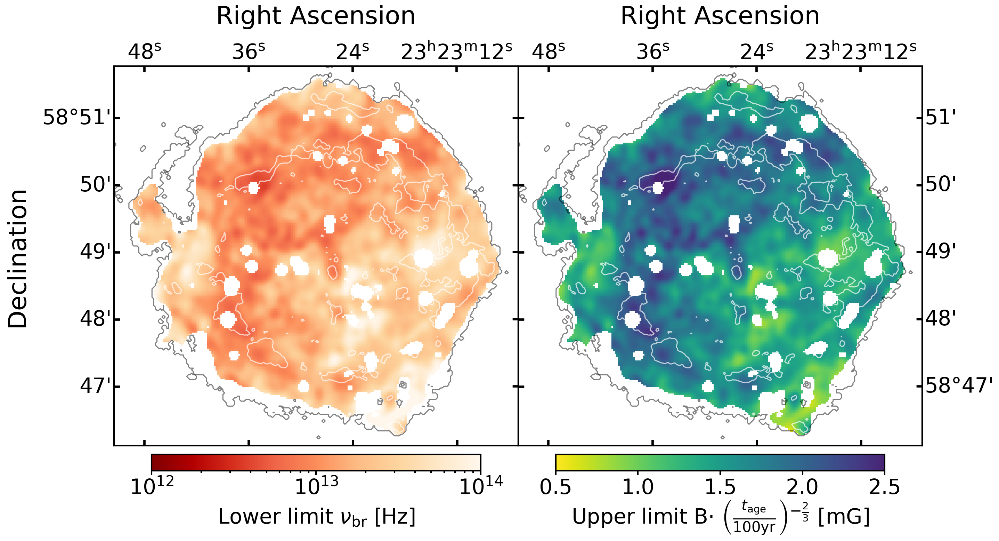

In [43]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'font.size': 20,
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_Hires[0].header))

cmap = cm.get_cmap('OrRd_r')
cmap.set_bad(color='white')
# cmap = truncate_colormap(cmap, 0., 0.95)

im = ax.imshow(nu_br*diff_mask, cmap=cmap, norm=LogNorm(vmin=1e12, vmax=1e14))
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True, bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True, left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'Lower limit $\nu _\mathrm{br}$ [Hz]', rotation=0, labelpad=12,fontsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.ax.plot(8e13, 1, 'w.')

plt.subplots_adjust(wspace=0.)


ax2 = fig.add_subplot(122, projection=WCS(hdu_Hires[0].header))

cmap = cm.get_cmap('viridis_r')
cmap = truncate_colormap(cmap, 0., 0.9)
cmap.set_bad(color='white')

im2 = ax2.imshow(B, cmap=cmap, vmin=0.5, vmax=2.5)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')
ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True, bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True, left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'Upper limit B$\cdot$ $\left( \frac{t_\mathrm{age}}{100\mathrm{yr}} \right)^{-\frac{2}{3}}}$ [mG]', rotation=0, labelpad=0,fontsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

test_map = np.copy(frac_mask)
test_map[np.isnan(test_map)] = 0
test_map[200:300,200:300] = 1
ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax2.contour(test_map, levels=[1], colors='black', alpha=0.5)


plt.savefig('figures/fig12_freq_break_mag_field_dalpha.pdf',bbox_inches='tight')
plt.show()



# Appendix A1 - Spitzer data

In [4]:
num_sim = 10000
x, y =  192, 180

In [5]:
Spitzer_flux_map = fits.open('data/intermediate_products/3_Spitzer_bin3_ch1_xheader_jy.fits')[0].data
Spitzer_flux_err = fits.open('data/intermediate_products/3_Spitzer_bin3_ch1_err_xheader_jy.fits')[0].data

Spitzer_flux_simulation = np.random.normal(Spitzer_flux_map[y, x], Spitzer_flux_err[y, x], num_sim)
bkg_distribution = np.random.normal(1e-5, 1.2e-6, num_sim)

Spitzer_fluxbkg_cor = Spitzer_flux_simulation - bkg_distribution


<Figure size 900x600 with 0 Axes>

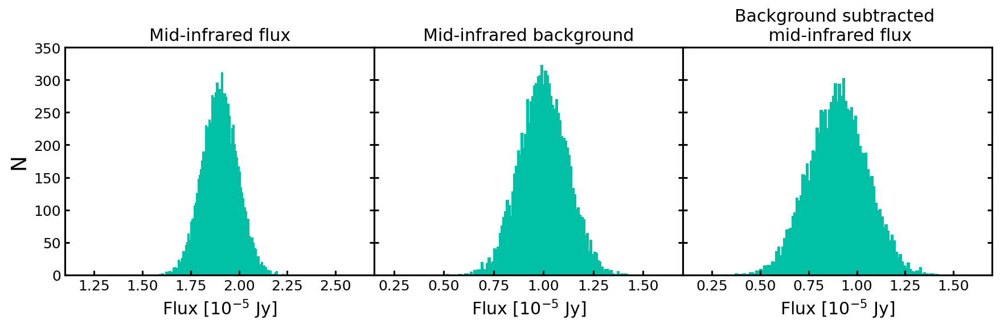

In [15]:
from matplotlib import cm
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'large',
          'ytick.labelsize': 'large',
          'figure.dpi': 150,
          'font.size': 10,
          'axes.linewidth': 1.5
         }
plt.rcParams.update(params)

plt.clf()

fig3_col_spitzer = "#00BFA5"
fig = plt.figure(figsize=(14,12))
ax10 = plt.subplot(331)            
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax10.hist(Spitzer_flux_simulation*1e5, bins=100,color=fig3_col_spitzer, edgecolor=fig3_col_spitzer)
ax10.set_title('Mid-infrared flux')
ax10.set_xlabel('Flux [10$^{-5}$ Jy]',size='x-large')
ax10.set_ylim(0,350)
ax10.set_xlim(1.1,2.7)
ax10.set_ylabel(r'N',size=18)


ax20 = plt.subplot(332, sharey = ax10)            
ax20.hist(bkg_distribution*1e5, bins=100, color=fig3_col_spitzer, edgecolor=fig3_col_spitzer)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax20.set_title('Mid-infrared background')
ax20.set_xlabel('Flux [10$^{-5}$ Jy]',size='x-large')
# ax20.set_ylim(0,350)
ax20.set_xlim(0.15,1.70)

ax30 = plt.subplot(333, sharey = ax10)            
ax30.hist( (Spitzer_flux_simulation-bkg_distribution)*1e5 , bins=100, color=fig3_col_spitzer, edgecolor=fig3_col_spitzer)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax30.set_title('Background subtracted \n mid-infrared flux')
ax30.set_xlabel('Flux [10$^{-5}$ Jy]',size='x-large')
ax30.set_xlim(0.1,1.7)

# plt.set_edgecolor('face')
plt.subplots_adjust(wspace=0.)
plt.setp(ax20.get_yticklabels(), visible=False)
plt.setp(ax30.get_yticklabels(), visible=False)
ax10.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax20.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax30.tick_params(axis='both', which='major', width=1.5, length=4, direction='in',  right=True, left=True)

plt.savefig('figures/figA1_spitzer_correction.pdf', bbox_inches='tight')

# Fig A2 - extinction

In [7]:
# N_H to Av conversion of Guver & Ozel (2009)
def nh_av(nh):
    av = nh/(np.random.normal(2.21,0.09,nh.size)*1e21)
    return av

# extinction curve equation of Indebetouw et al. (2004)
def extinc_curve(lam0,sim):
    return np.random.normal(0.61,0.04,sim) - np.random.normal(2.22,0.17,sim) * np.log10(lam0) + \
            np.random.normal(1.21,0.23,sim) * (np.log10(lam0))**2

In [8]:
nh_map = fits.open('data/intermediate_products/3_grid_nh_repro.fits')[0].data
nh_map[y, x]
nh = np.random.normal(nh_map[y,x]*1e22,0.1*nh_map[y,x]*1e22,num_sim)    # !replace with NH map and 10% error on the pixel values
av = nh_av(nh)

A36_Ak_extc = extinc_curve(3.6, num_sim)
A36_Av_extc = 10 ** A36_Ak_extc * (1./8.8)
A_36 = A36_Av_extc * av # !av is the matrix of converted NH -> av


<Figure size 900x600 with 0 Axes>

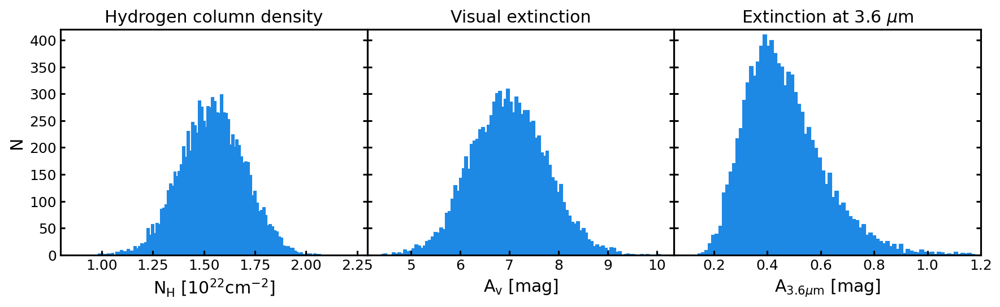

In [14]:
from matplotlib.ticker import (MultipleLocator)
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'large',
          'ytick.labelsize': 'large',
          'figure.dpi': 150,
          'axes.linewidth': 1.5
         }
plt.rcParams.update(params)

plt.clf()
fi3_col_chandra = "#1E88E5"

fig = plt.figure(figsize=(14,12))
ax30 = plt.subplot(333)            
ax30.hist(A_36, bins=100, color=fi3_col_chandra, edgecolor=fi3_col_chandra)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax30.set_title(r'Extinction at 3.6 $\mu$m')
ax30.set_xlabel(r'A$_{3.6\mu \mathrm{m}}$ [mag]',size='x-large')
ax30.set_xlim(0.05, 1.2)
ax30.set_ylim(0, 420)
ax30.yaxis.set_major_locator(MultipleLocator(50))

ax10 = plt.subplot(331, sharey = ax30)            
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax10.hist(nh*1e-22, bins=100,color=fi3_col_chandra, edgecolor=fi3_col_chandra)
ax10.set_title('Hydrogen column density')
ax10.set_xlabel(r'N$_\mathrm{H}$ [10$^{22}$cm$^{-2}$]',size='x-large')
ax10.set_xlim(0.8, 2.3)
ax10.set_ylabel(r'N',size='x-large')

ax20 = plt.subplot(332, sharey = ax30)            
ax20.hist(av, bins=100, color=fi3_col_chandra, edgecolor=fi3_col_chandra)
# plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax20.set_title('Visual extinction')
ax20.set_xlabel(r'A$_\mathrm{v}$ [mag]',size='x-large')




plt.subplots_adjust(wspace=0.)
plt.setp(ax20.get_yticklabels(), visible=False)
plt.setp(ax30.get_yticklabels(), visible=False)
ax10.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax20.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax30.tick_params(axis='both', which='major', width=1.5, length=4, direction='in',  right=True, left=True)


plt.savefig('figures/figA2_exticntion.pdf', bbox_inches='tight')

# Fig A3 - Spectral index

In [10]:
def ext_cor(flux, extinction):
    F0 = 277.5
    m = -2.5*np.log10(flux/F0) 
    m_c = m - extinction
    return F0 * 10**(-0.4*m_c)

# simple power law
def pl_index(flux1,flux2,vnu1,vnu2):
    return (np.log10(flux2)-np.log10(flux1)) / (np.log10(vnu2)-np.log10(vnu1))


In [11]:
Spitzer_flux_cor = ext_cor(Spitzer_fluxbkg_cor, A_36)

radio_map = fits.open('data/intermediate_products/3_Hires_bin3_xheader_fluxed_2009_nomask.fits')[0].data
radio_flux2009 = np.random.normal(radio_map[y,x],0.1*radio_map[y,x],num_sim)    

vnu1 = 4.72e9
vnu2 = (3.6 * u.micron).to(u.Hz, equivalencies=u.spectral()).value

alpha = pl_index(Spitzer_flux_cor,radio_flux2009,vnu2,vnu1)


<Figure size 900x600 with 0 Axes>

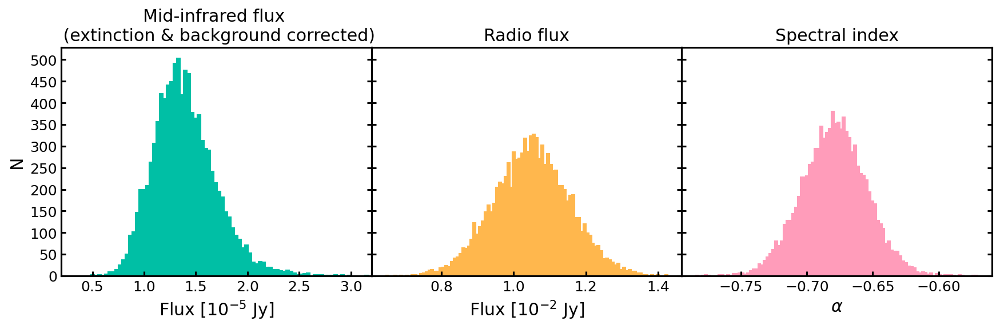

In [12]:
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'large',
          'ytick.labelsize': 'large',
          'figure.dpi': 150,
          'axes.linewidth': 1.5
         }
plt.rcParams.update(params)

plt.clf()

fig = plt.figure(figsize=(14,12))

ax10 = plt.subplot(331)            
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax10.hist(Spitzer_flux_cor*1e5, bins=100,color='#00BFA5', edgecolor='#00BFA5')
# ax10.set_xlim(0.6e-5, 3.5e-5)
ax10.set_xlim(0.2, 3.2)

ax10.set_title('Mid-infrared flux \n (extinction & background corrected)')
ax10.set_xlabel('Flux [10$^{-5}$ Jy]',size='x-large')
ax10.yaxis.set_major_locator(MultipleLocator(50))
ax10.set_ylabel(r'N',size='x-large')

ax20 = plt.subplot(332, sharey = ax10)            
ax20.hist(radio_flux2009*1e2, bins=100, color='#FFB74D', edgecolor='#FFB74D')
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax20.set_title('Radio flux')
ax20.set_xlabel('Flux [10$^{-2}$ Jy]',size='x-large')

ax30 = plt.subplot(333, sharey = ax10)            
ax30.hist(alpha, bins=100, color='#FF9CBA', edgecolor='#FF9CBA')
# plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
ax30.set_title(r'Spectral index')
ax30.set_xlabel(r'$\alpha$',size='x-large')


plt.subplots_adjust(wspace=0.)
plt.setp(ax20.get_yticklabels(), visible=False)
plt.setp(ax30.get_yticklabels(), visible=False)
ax10.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax20.tick_params(axis='both', which='major', width=1.5, length=4, direction='in', right=True, left=True)
ax30.tick_params(axis='both', which='major', width=1.5, length=4, direction='in',  right=True, left=True)



plt.savefig('figures/figA3_spectral_index.pdf', bbox_inches='tight')

# Fig A4 - star subtracted spitzer

In [53]:
hdu_spitzer_bin3_ch1_subpyraf = fits.open('data/intermediate_products/3_Spitzer_bin3_ch1_xheader_jy_subpyraf.fits')[0]
img_spitzer_bin3_ch1_subpyraf = hdu_spitzer_bin3_ch1_subpyraf.data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Greys"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases

<Figure size 900x600 with 0 Axes>

/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  super().draw(renderer, inframe=inframe)


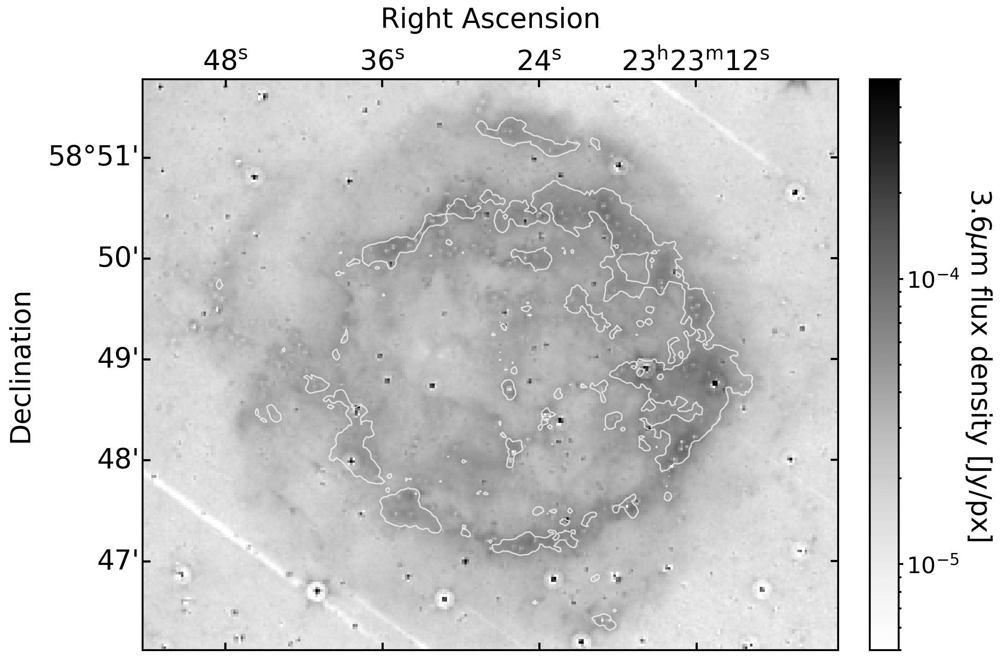

In [54]:
#Same thing in the DETECTOR COORDINATES
from matplotlib import cm
params = {'legend.fontsize': 'large',
          'axes.labelsize': 'x-large',
          'axes.titlesize': 'x-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'figure.dpi': 150,
          'font.size' : 20,
          'axes.linewidth': 2
         }

plt.clf()
fig = plt.figure(figsize=(20,11),dpi=150)
plt.rcParams.update(params)
#cmap = cm.get_cmap('magma_r')#, 12) #12 steps on the sidebar

plt.subplots_adjust(wspace=0.01)
plt.subplots_adjust(hspace=0.35)




ax1 = plt.subplot(111, projection=WCS(hdu_spitzer_bin3_ch1_subpyraf.header))
# ax1.set_title('Spitzer Ch1')
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax1.imshow(img_spitzer_bin3_ch1_subpyraf, cmap=cmap, norm=LogNorm(vmin=5e-6, vmax=5e-4))
cbar = fig.colorbar(im, ax=ax1, fraction=0.05, pad=0.03) 
cbar.set_label(r'3.6$\mu$m flux density [Jy/px]', rotation=270, labelpad=35,fontsize='x-large')
cbar.ax.tick_params(labelsize='large')
cbar.ax.tick_params(labelsize='large', which='major', length=5, width=2)
cbar.ax.tick_params(labelsize='large', which='minor', length=3, width=2)


ax1.set_xlim(100, 380)
ax1.set_ylim(140, 370)
ax1.coords['ra'].set_axislabel('Right Ascension')
ax1.coords['ra'].set_axislabel_position('top')
ax1.coords['ra'].set_ticklabel_position('top')
ax1.coords['dec'].set_axislabel('Declination')


ax1.tick_params(axis='x', which='major', width=2.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax1.tick_params(axis='y', which='major', width=2.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax1.tick_params(axis='both', which='minor', length=4)
ax1.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)

plt.savefig('figures/figA4_Spitzer_ch1_subpyraf.pdf',bbox_inches='tight')


plt.show()

# Fig A5 - Smoothed high-res radio data

In [55]:
hdu_spitzer_bin3_ch1_sm = fits.open('data/final_products/alpha_RIR_low-res/spitzer_flux_median_lowres_masked.fits')[0]
img_spitzer_bin3_ch1_sm = hdu_spitzer_bin3_ch1_sm.data

hdu_radio_4_72Ghz_bin3_sm = fits.open('data/final_products/alpha_RIR_low-res/radio_flux_median_lowres_masked.fits')[0]
img_radio_4_72Ghz_bin3_sm = hdu_radio_4_72Ghz_bin3_sm.data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("magma"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in less
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrBr"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:458: MatplotlibDeprecationWarning: 
The 'inframe' par

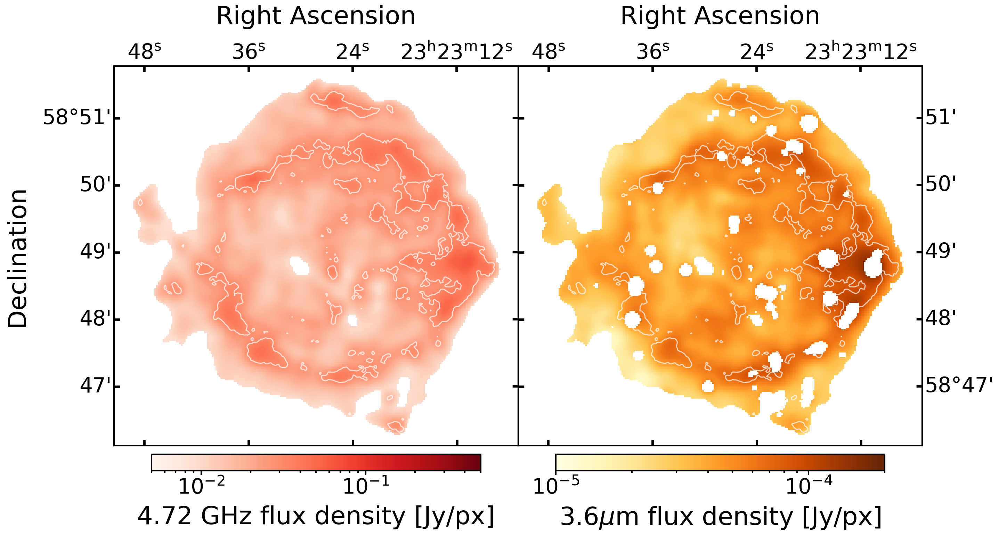

In [56]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)


fig = plt.figure(figsize=(20,11),dpi=150)



ax = fig.add_subplot(121, projection=WCS(hdu_radio_4_72Ghz_bin3_sm.header))

cmap = cm.get_cmap('magma')
cmap.set_bad(color='white')
radio_im = np.copy(img_radio_4_72Ghz_bin3_sm*BL10mask)
radio_im[radio_im<5e-3] = np.nan
im = ax.imshow(radio_im, cmap='Reds', norm=LogNorm(vmin=5e-3, vmax=5e-1))#, vmin=-0.8, vmax=-0.5)
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'4.72 GHz flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_spitzer_bin3_ch1_sm.header))


cmap = cm.get_cmap('YlOrBr')
cmap.set_bad(color='white')
im2 = ax2.imshow(img_spitzer_bin3_ch1_sm*diff_mask*BL10mask, cmap=cmap, norm=LogNorm(vmin=10e-6, vmax=2e-4))
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
# ax[0].coords.grid(color='white')
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')

# ax2.coords['dec'].set_axislabel('Declination')
# ax2.coords['dec'].set_axislabel_position('right')
ax2.coords['dec'].set_ticklabel_position('right')
# ax2.coords['dec'].set_ticklabel_width(3)

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)

cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'3.6$\mu$m flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)

plt.savefig('figures/figA5_radio_spitzer_cont_smoothed.pdf',bbox_inches='tight')
plt.show()



# Fig A6 - smoothed spectral index map alpha_R-IR

In [57]:
alpha_sm = fits.open('data/final_products/alpha_RIR_low-res/alpha_R-IR_median_lowres_masked.fits')[0].data
alpha_sm_err = fits.open('data/final_products/alpha_RIR_low-res/alpha_R-IR_err_lowres_masked.fits')[0].data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdYlBu_r"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Oranges"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visualization/wcsaxes/core.py:225: UserWarning: No contour levels were found within the data range.
  cset = super().contour(*args, **kwargs)
/home/vdomcek/anaconda3/lib/python3.7/site-packages/astropy/visua

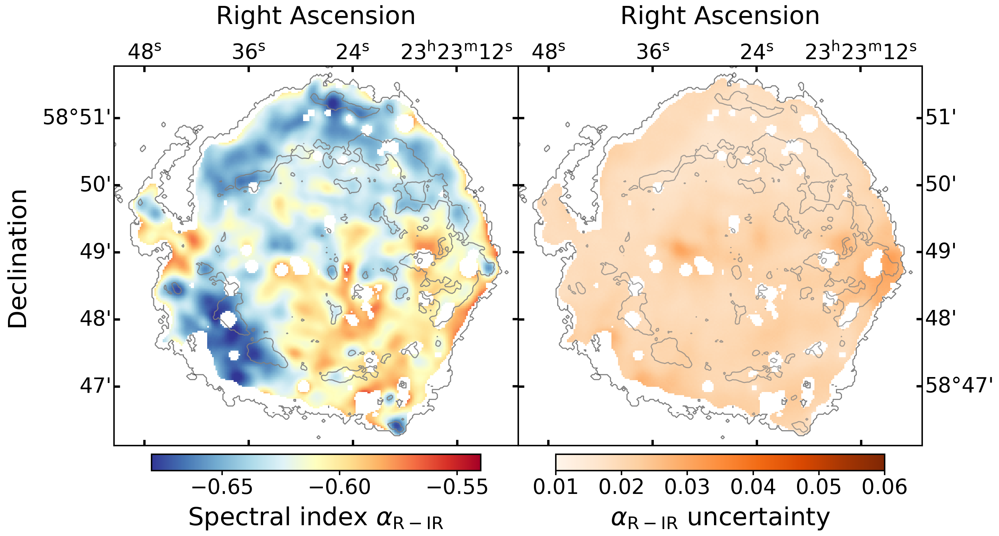

In [58]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)

fig = plt.figure(figsize=(20,11),dpi=150)

ax = fig.add_subplot(121, projection=WCS(hdu_SPINBL10[0].header))

cmap = cm.get_cmap('RdYlBu_r')
cmap.set_bad(color='white')


im = ax.imshow(alpha_sm*radio_hires_lowflux_mask*BL10mask*diff_mask, cmap=cmap, vmin=-0.68, vmax=-0.54)
ax.set_xlim(115, 360)
ax.set_ylim(140, 370)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)
cbar.set_label(r'Spectral index $\alpha _\mathrm{R-IR}$ ', rotation=0, labelpad=10)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_SPINERR10[0].header))


cmap = cm.get_cmap('Oranges')
cmap.set_bad(color='white')

im2 = ax2.imshow(alpha_sm_err*radio_hires_lowflux_mask*BL10mask*diff_mask, cmap=cmap, vmin=0.01, vmax=0.06)
ax2.set_xlim(115, 360)
ax2.set_ylim(140, 370)
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')


ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)


cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
# cbar.set_clim(0, 1)

cbar.set_label(r'$\alpha _\mathrm{R-IR}$ uncertainty', rotation=0, labelpad=10)

cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)


ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.9)
ax.contour(test_map, levels=[1], colors='black', alpha=0.5)

ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='C7', alpha=0.7)
ax2.contour(test_map, levels=[1], colors='black', alpha=0.5)


plt.savefig('figures/figA6_sp_index_and_err_RdYlBu_smooth.pdf',bbox_inches='tight')
plt.show()



# Bonus - L- and C- bands

In [59]:
hdu_L10 = fits.open('data/intermediate_products/3_L10_bin3_xheader.fits')
img_L10 = hdu_L10[0].data

hdu_C10 = fits.open('data/intermediate_products/3_C10_bin3_xheader.fits')
img_C10 = hdu_C10[0].data

/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("magma"))
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in less
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in less
/home/vdomcek/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Reds"))
/home/vdomcek/ana

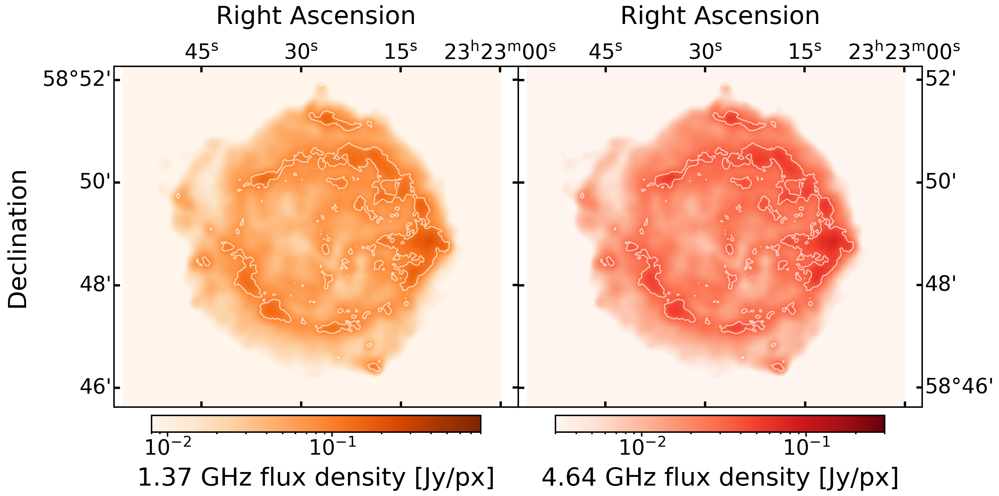

In [60]:
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
          'axes.linewidth': 2,
          'figure.dpi': 150
         }

plt.rcParams.update(params)


fig = plt.figure(figsize=(20,11),dpi=150)



ax = fig.add_subplot(121, projection=WCS(hdu_L10[0].header).sub(2))

cmap = cm.get_cmap('magma')
cmap.set_bad(color='white')

img_L10[img_L10<8e-3] = 8e-3
im = ax.imshow(img_L10, cmap='Oranges', norm=LogNorm(vmin=8e-3, vmax=8e-1))
ax.set_xlim(80, 400)
ax.set_ylim(120, 390)
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['ra'].set_axislabel_position('top')
ax.coords['ra'].set_ticklabel_position('top')
ax.coords['dec'].set_axislabel('Declination')


ax.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax.tick_params(axis='both', which='minor', length=4)

cbar = plt.colorbar(im, ax=ax, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'1.37 GHz flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

plt.subplots_adjust(wspace=0.)

ax2 = fig.add_subplot(122, projection=WCS(hdu_C10[0].header).sub(2))

img_C10[img_C10<3e-3] = 3e-3
cmap = cm.get_cmap('Reds')
cmap.set_bad(color='white')
im2 = ax2.imshow(img_C10, cmap=cmap, norm=LogNorm(vmin=3e-3, vmax=3e-1))
ax2.set_xlim(80, 400)
ax2.set_ylim(120, 390)
# ax[0].coords.grid(color='white')
ax2.coords['ra'].set_axislabel('Right Ascension')
ax2.coords['ra'].set_axislabel_position('top')
ax2.coords['ra'].set_ticklabel_position('top')
ax2.coords['dec'].set_ticklabel_position('right')

ax2.tick_params(axis='x', which='major', width=3.00, length=8, direction='in', labelsize='x-large', top=True,
               bottom=True)
ax2.tick_params(axis='y', which='major', width=3.00, length=8, direction='in', labelsize='x-large', right=True,
               left=True)
ax2.tick_params(axis='both', which='minor', length=4)

cbar = fig.colorbar(im2, ax=ax2, fraction=0.038, pad=0.02, orientation="horizontal")
cbar.set_label(r'4.64 GHz flux density [Jy/px]', rotation=0, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')
cbar.ax.tick_params(labelsize='x-large', which='major', length=6, width=2)
cbar.ax.tick_params(labelsize='x-large', which='minor', length=3, width=2)

ax.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)
ax2.contour(img_radio_4_72Ghz_bin3, levels=[0.030], colors='white', alpha=0.7)

plt.savefig('figures//figB_radio_L10_C10.pdf',bbox_inches='tight')
plt.show()


# Fig.9 - Histogram and SED